<p style="text-align:center">
    <a href="https://skills.network" target="_blank">
    <img src="https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/assets/logos/SN_web_lightmode.png" width="300" alt="Skills Network Logo">
    </a>
</p>


# Exploratory Data Analysis


Estimated time needed: **30** minutes
    

## Objectives

After completing this lab you will be able to:

* Explore features or characteristics to predict price of car
* Analyze patterns and run descriptive statistical analysis
* Group data based on identified parameters and create pivot tables
* Identify the effect of independent attributes on price of cars


<!-- <h2>Table of Contents</h2>

<div class="alert alert-block alert-info" style="margin-top: 20px">
<ol>
    <li><a href='#Import-Data-from-Module-2'>Data Cleaning: Handle NA Values</a>
    <li><a href='#Analyzing-Individual-Feature-Patterns-Using-Visualization'>Analyzing Individual Feature Patterns using Visualization</a>
    <li><a href='#Descriptive-Statistical-Analysis'>Descriptive Statistical Analysis</a>
    <li><a href='#Basics-of-Grouping'>Basics of Grouping</a>
    <li><a href='#Correlation-and-Causation'>Correlation and Causation</a>
</ol>

</div>
 
<hr> -->

<a class="anchor"  id="chapter0"></a>



<h2>Table of Contents</h2>



 ---
<div class="alert alert-block alert-info" style="margin-top: 20px">
<ol>
 
  ## [1) Exploratory Analysis](#chapter1)
[1.1 Display the distribution of the JobRole attribute data in a violin plot](#section_1.1)   
[1.2 Present the average monthly income (MonthlyIncome) by education field (EducationField) and attrition (Attrition).Use Pandas Groupby.](#section_1.2) 

## [2) Pre-processing](#chapter2) 
[2.1 Categorical data transformation ](#section_2.1)    
[2.2 Normalization](#section_2.2)    
[2.3 Feature Selection Filter vs Wrapper](#section_2.3)    
[2.4 Validate the Feature Selection techniques with at least 1 classifier](#section_2.4)    
[2.5 Venn diagram with at least 3 different Feature Selection techniques](#section_2.5)    

## [3) Predictive Models and Validation](#chapter3)
[3.1 Run with the best subset of features investigated in step 2 (Filter or Wrapper)](#section_3.1)   
[3.2 KNN, Decision Tree and Random Forest](#section_3.2)   
[3.3 Compare the results between GridSearch and Random Search d) Present the summary with the metrics Precision, Recall, F1-Score and Accuracy](#section_3.3)   
[3.4 Predictive Models Present the summary with the Precision, Recall, F1-Score and Accuracye validation metrics](#section_3.4)   
[3.5 Automate the execution of all steps using a pipeline](#section_3.5)

In [1]:
import pandas as pd
import numpy as np

import plotly.express as px
import plotly.graph_objects as go

from sklearn.preprocessing import LabelEncoder # Transformation from Categorical to numeric
from sklearn.preprocessing import OneHotEncoder# Transformation from Categorical to numeric
from sklearn.preprocessing import StandardScaler # Normalization




from sklearn.compose import ColumnTransformer # Recover columns names after transformation

In [2]:
df1 = pd.read_csv(r"D:\repositorio\Bengaluru\Curitiba\curitiba_apartment_real_estate_data.csv")
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18760 entries, 0 to 18759
Data columns (total 18 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   usableAreas      18760 non-null  int64  
 1   totalAreas       18030 non-null  float64
 2   suites           17456 non-null  float64
 3   bathrooms        18760 non-null  int64  
 4   bedrooms         18760 non-null  int64  
 5   parkingSpaces    18097 non-null  float64
 6   amenities        18760 non-null  object 
 7   description      18730 non-null  object 
 8   title            18633 non-null  object 
 9   zipCode          18760 non-null  int64  
 10  lon              13195 non-null  float64
 11  lat              13195 non-null  float64
 12  street           15689 non-null  object 
 13  neighborhood     18760 non-null  object 
 14  poisList         18760 non-null  object 
 15  yearlyIptu       14412 non-null  float64
 16  monthlyCondoFee  15169 non-null  float64
 17  price       

In [3]:
df1.poisList[0]

"['BS:Estação Tubo Holanda', 'BS:Estação-tubo Gago Coutinho', 'BS:Estação Antonio Cavalheiros - Sta Candida/Capão Raso', 'BS:Estação Tubo Ahú', 'BS:Santa Cândida/Capão Raso', 'TS:Estação Tubo Holanda', 'TS:Terminal Boa Vista (200/203)', 'TS:Estação Tubo Ahú', 'TS:Estação Tubo Antônio Cavalheiros', 'TS:Terminal Cabral - 207', 'CS:Brasipan', 'CS:Espaço Vegano', 'CS:A Massa Panificadora e Confeitaria', 'CS:Fábrica do Pão', 'CS:Aquarius', 'CH:GNDI Centro Clínico Oncológico', 'CH:Unidade de Saúde Medianeira']"

In [4]:
df1.shape

(18760, 18)

In [5]:
df1.columns

Index(['usableAreas', 'totalAreas', 'suites', 'bathrooms', 'bedrooms',
       'parkingSpaces', 'amenities', 'description', 'title', 'zipCode', 'lon',
       'lat', 'street', 'neighborhood', 'poisList', 'yearlyIptu',
       'monthlyCondoFee', 'price'],
      dtype='object')

In [6]:
df1.describe()

,usableAreas,totalAreas,suites,bathrooms,bedrooms,parkingSpaces,zipCode,lon,lat,yearlyIptu,monthlyCondoFee,price
count,18760.000000,18030.000000,17456.000000,18760.000000,18760.000000,18097.000000,1.876000e+04,13195.000000,13195.000000,1.441200e+04,1.516900e+04,1.876000e+04
mean,111.940938,204.335996,1.234934,2.385075,2.499200,1.583246,8.063613e+07,-49.281718,-25.442629,3.085847e+03,4.179377e+03,1.099262e+06
std,101.236947,2018.776854,1.049820,1.376859,0.880757,1.158257,6.462913e+05,0.056163,0.051163,1.540960e+05,1.608748e+05,1.840035e+06
min,10.000000,1.000000,0.000000,1.000000,1.000000,0.000000,8.001000e+07,-54.584012,-25.585247,0.000000e+00,0.000000e+00,8.500000e+02
25%,57.000000,69.000000,1.000000,1.000000,2.000000,1.000000,8.024002e+07,-49.291754,-25.456533,0.000000e+00,0.000000e+00,3.500000e+05
50%,89.000000,119.000000,1.000000,2.000000,3.000000,1.000000,8.053001e+07,-49.283922,-25.439361,0.000000e+00,3.800000e+02,6.500000e+05
75%,139.000000,199.000000,2.000000,3.000000,3.000000,2.000000,8.073032e+07,-49.264674,-25.431595,1.500000e+02,7.300000e+02,1.267950e+06
max,5000.000000,174932.000000,8.000000,11.000000,8.000000,40.000000,9.701049e+07,-49.180834,-20.434671,1.503353e+07,1.600000e+07,1.290331e+08


In [7]:
df1.isna().sum()

usableAreas           0
totalAreas          730
suites             1304
bathrooms             0
bedrooms              0
parkingSpaces       663
amenities             0
description          30
title               127
zipCode               0
lon                5565
lat                5565
street             3071
neighborhood          0
poisList              0
yearlyIptu         4348
monthlyCondoFee    3591
price                 0
dtype: int64

## Data Cleaning: NA Values

In [8]:
df_drop_nan = df1.copy()
df_drop_nan.head()

,usableAreas,totalAreas,suites,bathrooms,bedrooms,parkingSpaces,amenities,description,title,zipCode,lon,lat,street,neighborhood,poisList,yearlyIptu,monthlyCondoFee,price
0,77,90.0,1.0,2,3,1.0,"['BARBECUE_GRILL', 'ELEVATOR', 'GATED_COMMUNIT...","Apartamento com 3 dormitórios, sendo uma suíte...",Apartamento para venda tem 77 metros quadrados...,82540130,-49.249319,-25.394261,Rua Nossa Senhora de Nazaré,Boa Vista,"['BS:Estação Tubo Holanda', 'BS:Estação-tubo G...",700.0,400.0,595000
1,53,53.0,NaN,1,3,1.0,"['BARBECUE_GRILL', 'GATED_COMMUNITY', 'GYM', '...",Apartamento ensolarado e com linda vista pro P...,Apartamento ensolarado com 3 quartos ao lado d...,81320180,-49.326716,-25.474533,Rua Alfredo José Pinto,Fazendinha,"['BS:Rua José Gonçalves Júnior, 182', 'BS:Rua ...",NaN,392.0,185000
2,113,NaN,1.0,4,3,2.0,"['POOL', 'BARBECUE_GRILL', 'ELEVATOR', 'GATED_...","22º andar, face Norte, linda vista para a Serr...",Apt para venda no Cond. Botânica: 113 m² com 3...,80050470,-49.239110,-25.437162,Rua Coronel Pedro Scherer Sobrinho,Cristo Rei,"['BS:Estação Hospital Cajuru', 'BS:Linha Turis...",240.0,550.0,1220000
3,93,106.0,1.0,2,3,2.0,"['POOL', 'FURNISHED', 'BARBECUE_GRILL', 'ELEVA...",Apartamento Residencial com 70m2 interno total...,Apartamento Mobiliado de Porteira Fechada incl...,81210310,-49.335318,-25.442254,Rua Jeremias Maciel Perretto,Campo Comprido,"['BS:Estação-tubo Mossunguê', 'BS:Mossunguê', ...",400.0,600.0,610000
4,66,NaN,1.0,2,3,1.0,"['BARBECUE_GRILL', 'GATED_COMMUNITY', 'PETS_AL...",Excelente apto garden com 66m² de área útil em...,Apartamento Novo Mundo 66m² útil,81050150,-49.304465,-25.492857,Rua Deputado Waldemiro Pedroso,Novo Mundo,"['BS:Ponto - 672 Formosa', 'BS:Ponto - 615 Ube...",NaN,NaN,269990


In [9]:
df_drop_nan.shape

(18760, 18)

In [10]:
df_drop_nan.isna().sum()

usableAreas           0
totalAreas          730
suites             1304
bathrooms             0
bedrooms              0
parkingSpaces       663
amenities             0
description          30
title               127
zipCode               0
lon                5565
lat                5565
street             3071
neighborhood          0
poisList              0
yearlyIptu         4348
monthlyCondoFee    3591
price                 0
dtype: int64

First we will drop features that are not requered to build our model.

In [11]:
df_without_features = df_drop_nan.drop(['description', 'title','zipCode', 'lon', 'lat', 'street', 'poisList', 'yearlyIptu'], axis= 'columns')

In [12]:
df_without_features.head()

,usableAreas,totalAreas,suites,bathrooms,bedrooms,parkingSpaces,amenities,neighborhood,monthlyCondoFee,price
0,77,90.0,1.0,2,3,1.0,"['BARBECUE_GRILL', 'ELEVATOR', 'GATED_COMMUNIT...",Boa Vista,400.0,595000
1,53,53.0,NaN,1,3,1.0,"['BARBECUE_GRILL', 'GATED_COMMUNITY', 'GYM', '...",Fazendinha,392.0,185000
2,113,NaN,1.0,4,3,2.0,"['POOL', 'BARBECUE_GRILL', 'ELEVATOR', 'GATED_...",Cristo Rei,550.0,1220000
3,93,106.0,1.0,2,3,2.0,"['POOL', 'FURNISHED', 'BARBECUE_GRILL', 'ELEVA...",Campo Comprido,600.0,610000
4,66,NaN,1.0,2,3,1.0,"['BARBECUE_GRILL', 'GATED_COMMUNITY', 'PETS_AL...",Novo Mundo,NaN,269990


In [13]:
df_without_features.isna().sum()

usableAreas           0
totalAreas          730
suites             1304
bathrooms             0
bedrooms              0
parkingSpaces       663
amenities             0
neighborhood          0
monthlyCondoFee    3591
price                 0
dtype: int64

## Data Cleaning: 'usableAreas' NaN values and outliers

In [14]:
df_usable_areas = df_without_features.copy()

In [15]:
def distribution(df,column, marginal = 'box'):
    fig = px.histogram(df, x=column, marginal= marginal)
    fig2 = px.violin(df, x=column, box=True)
    return fig.show(), fig2.show()


In [16]:
distribution(df_usable_areas,'usableAreas',marginal= 'box')


(None, None)

The graph above shows anomalously high values for 'usableArea'', such as 5000 m² and 2300 m², which likely represent error or outliersly  erroneous.


In [17]:
sum(df_usable_areas.usableAreas > 262)

1056

In [18]:
df_usable_areas.usableAreas.sort_values(ascending=True)

13438      10
13464      10
18635      10
10499      10
16285      10
         ... 
18183    1300
17684    1501
9232     2300
101      5000
14317    5000
Name: usableAreas, Length: 18760, dtype: int64

So, to drop the outliers, we will calculate the quartile Q1 (25%) and Q3 (75%), then calculate the Interquartile Range (IQR) to calculate the max_boundary. Values exceeding this max_boundary will be resized to the mean monthlyCondoFee value of their respective neighborhoods.

In [19]:
min_value_usableAreas = df_usable_areas.usableAreas.min()
q1_usableAreas, q3_usableAreas = np.percentile(df_usable_areas.usableAreas, [25,75])
median_usableAreas = df_usable_areas.usableAreas.median()
max_value_usableAreas = df_usable_areas.usableAreas.max()

print(f'Minimum value: {min_value_usableAreas} \nQ1:{q1_usableAreas} \nQ3: {q3_usableAreas} \nMedian: {median_usableAreas} \nMaximum Value:{max_value_usableAreas}')
# Fill data <10 and NaN with the mean value


Minimum value: 10 
Q1:57.0 
Q3: 139.0 
Median: 89.0 
Maximum Value:5000



We'll calculate the mean monthlyCondoFee for each neighborhood using values between 10 and the upper boundary. Then, we'll fill these values with calculated means

In [20]:
iqr_usableAreas = q3_usableAreas-q1_usableAreas
upper_boundry_usableAreas = q3_usableAreas + 1.5*iqr_usableAreas
print(f'Upper Boundry: {upper_boundry_usableAreas}')

Upper Boundry: 262.0


In [21]:
# Fill data <10 and NaN with the mean value
df_usable_areas = df_usable_areas[df_usable_areas['usableAreas'] <= upper_boundry_usableAreas]


In [22]:
distribution(df_usable_areas,'usableAreas',marginal= 'box')

(None, None)

In [23]:
df_usable_areas.shape

(17704, 10)

## Data Cleaning: 'totalAreas' NaN values and outliers

considerando área de cada garagem em  13 m²

In [24]:
df_total_areas = df_usable_areas.copy()

In [25]:
distribution(df_total_areas,'totalAreas',marginal= 'box')

(None, None)

In [26]:
sum(df_total_areas.totalAreas.isna())

709

In [27]:
df_total_areas.dropna(subset='totalAreas', inplace=True)

In [28]:
min_value_totalAreas = df_total_areas.totalAreas.min()
q1_totalAreas, q3_totalAreas = np.percentile(df_total_areas.totalAreas, [25,75])
median_totalAreas = df_total_areas.totalAreas.median()
max_value_totalAreas = df_total_areas.totalAreas.max()

print(f'Minimum value: {min_value_totalAreas} \nQ1:{q1_totalAreas} \nQ3: {q3_totalAreas} \nMedian: {median_totalAreas} \nMaximum Value:{max_value_totalAreas}')


iqr_totalAreas = q3_totalAreas-q1_totalAreas
upper_boundry_totalAreas = q3_totalAreas + 1.5*iqr_totalAreas
print(f'Upper Boundry: {upper_boundry_totalAreas}')



df_total_areas = df_total_areas[df_total_areas['totalAreas'] <= upper_boundry_totalAreas]

Minimum value: 1.0 
Q1:66.0 
Q3: 179.0 
Median: 112.0 
Maximum Value:151746.0
Upper Boundry: 348.5


In [29]:
df_total_areas = df_total_areas[df_total_areas.totalAreas >= df_total_areas.usableAreas]

In [30]:
distribution(df_total_areas,'totalAreas',marginal= 'box')

(None, None)

In [31]:
df_total_areas.isna().sum()

usableAreas           0
totalAreas            0
suites             1146
bathrooms             0
bedrooms              0
parkingSpaces       581
amenities             0
neighborhood          0
monthlyCondoFee    3076
price                 0
dtype: int64

## 
## 1) Data Cleaning: Handle NA Values and outliers in 'suites' <a class="anchor"  id="chapter1"></a> 

#### [back to contents](#chapter0) 

In [32]:
df_suites = df_total_areas.copy()

In [33]:
df_suites.suites.describe()

count    14919.000000
mean         1.076480
std          0.904834
min          0.000000
25%          1.000000
50%          1.000000
75%          1.000000
max          4.000000
Name: suites, dtype: float64

In [34]:
distribution(df_suites,'suites',marginal= 'box')

(None, None)

In [35]:
df_suites.loc[df_suites.suites.isna(),'suites'] = df_suites.apply(lambda row: 1 if row.bathrooms > 1 else 0, axis = 1)

In [36]:
distribution(df_suites,'suites',marginal= 'box')

(None, None)

## 
## 1) Data Cleaning: Handle NA Values and outliers in 'bathrooms' <a class="anchor"  id="chapter1"></a> 

#### [back to contents](#chapter0) 

In [37]:
df_bathrooms = df_suites.copy()

In [38]:
df_bathrooms.bathrooms.describe()

count    16065.000000
mean         2.180330
std          1.176647
min          1.000000
25%          1.000000
50%          2.000000
75%          3.000000
max          6.000000
Name: bathrooms, dtype: float64

In [39]:
distribution(df_bathrooms,'bathrooms',marginal= 'box')

(None, None)

## 
## 1) Data Cleaning: Handle NA Values and outliers in 'bedrooms' <a class="anchor"  id="chapter1"></a> 

#### [back to contents](#chapter0) 

In [40]:
df_bedrooms = df_bathrooms.copy()

In [41]:
df_bedrooms.bedrooms.describe()

count    16065.000000
mean         2.406536
std          0.826446
min          1.000000
25%          2.000000
50%          3.000000
75%          3.000000
max          6.000000
Name: bedrooms, dtype: float64

In [42]:
distribution(df_bedrooms,'bedrooms',marginal= 'box')

(None, None)

## 
## 1) Data Cleaning: Handle NA Values and outliers in 'neighborhood' <a class="anchor"  id="chapter1"></a> 

#### [back to contents](#chapter0) 

In [43]:
df2 = df_bedrooms.copy()

In [44]:
df2.neighborhood.unique()

array(['Boa Vista', 'Fazendinha', 'Campo Comprido', 'Santa Quitéria',
       'Bacacheri', 'Bigorrilho', 'Mercês', 'Portão', 'Cristo Rei',
       'Capão Raso', 'Água Verde', 'Santo Inácio', 'Centro', 'Novo Mundo',
       'Sítio Cercado', 'Rebouças', 'Alto Boqueirão', 'Seminário',
       'Vila Izabel', 'Batel', 'Campo de Santana', 'Alto da Rua XV',
       'Cabral', 'Campina do Siqueira', 'Alto da Glória', 'Ahú', 'Juvevê',
       'Prado Velho', 'Cidade Industrial', 'Tingui', 'Pinheirinho',
       'Xaxim', 'Jardim Botânico', 'Santa Cândida', 'Mossunguê',
       'Parolin', 'Tarumã', 'Guaíra', 'Uberaba', 'Hugo Lange', 'Atuba',
       'Centro Cívico', 'São Francisco', 'Hauer', 'Vista Alegre',
       'Jardim Social', 'Boqueirão', 'Cajuru', 'Lindóia', 'Bairro Alto',
       'Bom Retiro', 'Orleans', 'Pilarzinho', 'Umbará', 'Fanny',
       'Abranches', 'Barreirinha', 'Tatuquara', 'Guabirotuba',
       'Cascatinha', 'Capão da Imbuia', 'São Lourenço', 'Cachoeira',
       'Jardim das Américas', 'Sant

In [45]:
df2.neighborhood.nunique()

73

In [46]:
(pd.DataFrame(df2.neighborhood.value_counts(True)*100) < 1).sum()

proportion    54
dtype: int64

In [47]:
(pd.DataFrame(df2.neighborhood.value_counts(True)*100) >=1).sum()

proportion    19
dtype: int64

In [48]:
#Proportion in % of each neighborhood
pd.DataFrame(df2['neighborhood'].value_counts(True)*100).head(60)

,proportion
neighborhood,
Água Verde,20.024899
Centro,16.613757
Bigorrilho,11.845627
Batel,6.006847
Rebouças,4.774354
Portão,3.267974
Vila Izabel,3.075008
Cabral,3.037660
Cidade Industrial,2.633053


Considering the datas above, we will work with neighborhoods with more than 1% of the total samples. Samples with less than 1% will be grouped in one category named 'Others'

In [49]:

neighborhood_percent = df2.neighborhood.value_counts(ascending=False,  normalize = True)*100
neighborhood_percent_less_than_1 = neighborhood_percent[neighborhood_percent < 1]
neighborhood_percent_less_than_1


neighborhood
Tingui                      0.827887
Pinheirinho                 0.827887
Alto da Glória              0.771864
Campina do Siqueira         0.678494
Santa Cândida               0.672269
Seminário                   0.628696
Alto da Rua XV              0.566449
São Francisco               0.429505
Jardim Botânico             0.404606
Guaíra                      0.385932
Tarumã                      0.385932
Boqueirão                   0.367258
Atuba                       0.361033
Santa Quitéria              0.361033
Cajuru                      0.354809
Xaxim                       0.336134
Centro Cívico               0.323685
Fazendinha                  0.280112
Uberaba                     0.255213
Prado Velho                 0.248988
Hugo Lange                  0.248988
Santa Felicidade            0.230314
Santo Inácio                0.230314
Sítio Cercado               0.217865
Lindóia                     0.186741
Parolin                     0.186741
Tatuquara                

In [50]:
#Grouping neighborhood with less than 1% of the total of rows 
df2.neighborhood = df2.neighborhood.apply(lambda x: 'outros' if x in neighborhood_percent_less_than_1 else x )

In [51]:
pd.DataFrame(df2['neighborhood'].value_counts(True)*100).head(60)

,proportion
neighborhood,
Água Verde,20.024899
Centro,16.613757
outros,12.387177
Bigorrilho,11.845627
Batel,6.006847
Rebouças,4.774354
Portão,3.267974
Vila Izabel,3.075008
Cabral,3.037660


## 
## 2) Data Cleaning: Handle NA Values and outliers in 'monthlyCondoFee' <a class="anchor"  id="chapter1"></a> 

#### [back to contents](#chapter0) 

In [52]:
df3 = df2.copy()

In [53]:
print(f'Number of rows empty (Nan):\n{df3.isna().sum()} \n')
print(f'Number of rows with "monthlyCondoFee" less than 10: {sum(df3.monthlyCondoFee <= 10)}')

Number of rows empty (Nan):
usableAreas           0
totalAreas            0
suites                0
bathrooms             0
bedrooms              0
parkingSpaces       581
amenities             0
neighborhood          0
monthlyCondoFee    3076
price                 0
dtype: int64 

Number of rows with "monthlyCondoFee" less than 10: 4518


In [54]:
distribution(df1,'monthlyCondoFee',marginal= 'box')

(None, None)

The graph above shows anomalously high values for monthlyCondoFee (R$), such as 7.33M and 16M, which likely represent error or outliersly or erroneous.


In [55]:
df_fillna = df3.copy()
df_fillna_bigger_10 = df_fillna[df_fillna['monthlyCondoFee'] >=10]
df_fillna_bigger_10.groupby('neighborhood')['monthlyCondoFee'].mean().sort_values(ascending = False)




neighborhood
Bigorrilho           8754.927746
Boa Vista            8333.077778
Água Verde           6024.895194
Batel                4624.520958
Cristo Rei           2988.485477
Portão               2938.342697
Ahú                  2931.318182
Centro               2194.232044
Mercês               1658.283333
Capão Raso           1368.926230
Rebouças             1299.443686
Bacacheri            1065.448980
Mossunguê             959.937500
Cidade Industrial     831.734694
Cabral                817.686992
Juvevê                781.144928
outros                765.539185
Campo Comprido        740.439024
Vila Izabel           539.061303
Novo Mundo            397.271676
Name: monthlyCondoFee, dtype: float64

The outliers distort the neighborhood values, making them appear unrealistically high.

So, to drop the outliers, we will calculate the quartile Q1 (25%) and Q3 (75%), then calculate the Interquartile Range (IQR) to calculate the max_boundary. Values exceeding this max_boundary will be resized to the mean monthlyCondoFee value of their respective neighborhoods.

In [56]:
min_value = df_fillna_bigger_10.monthlyCondoFee.min()
q1, q3 = np.percentile(df_fillna_bigger_10.monthlyCondoFee, [25,75])
median = df_fillna_bigger_10.monthlyCondoFee.median()
max_value = df_fillna_bigger_10.monthlyCondoFee.max()

print(f'Minimum value: {min_value} \nQ1:{q1} \nQ3: {q3} \nMedian: {median} \nMaximum Value:{max_value}')

Minimum value: 10.0 
Q1:380.0 
Q3: 841.0 
Median: 550.0 
Maximum Value:2970000.0


In [57]:
iqr = q3-q1
upper_boundry = q3 + 1.5*iqr
print(f'Upper Boundry: {upper_boundry}')


Upper Boundry: 1532.5



We'll calculate the mean monthlyCondoFee for each neighborhood using values between 10 and the upper boundary. Then, we'll fill these values with calculated means

In [58]:
df_drop_outliers = df3.copy()
df_drop_outliers_upper_boundry = df_drop_outliers.loc[df_drop_outliers['monthlyCondoFee'] <= upper_boundry, :]  # Droping outliers upper bounderies
df_drop_outliers_upper_boundry_bigger_10 = df_drop_outliers_upper_boundry.loc[df_drop_outliers_upper_boundry['monthlyCondoFee'] >= 10, :].dropna(subset='monthlyCondoFee') # Dropping monthlyCondoFee < 10 and NaN

# Calculate mean monthlyCondoFee by neighborhood (without NaN and values below 10)
mean_values = df_drop_outliers_upper_boundry_bigger_10.groupby('neighborhood')['monthlyCondoFee'].mean()

# Fill data <10 and NaN with the mean value
df_drop_outliers.loc[(df_drop_outliers['monthlyCondoFee'] <= 10) | (df_drop_outliers['monthlyCondoFee'] >= upper_boundry) | (df_drop_outliers['monthlyCondoFee'].isna()), 'monthlyCondoFee'] = df_drop_outliers['neighborhood'].map(mean_values)

In [59]:
df_drop_outliers.isna().sum()

usableAreas          0
totalAreas           0
suites               0
bathrooms            0
bedrooms             0
parkingSpaces      581
amenities            0
neighborhood         0
monthlyCondoFee      0
price                0
dtype: int64

In [60]:
df_drop_outliers.groupby('neighborhood')['monthlyCondoFee'].mean().sort_values(ascending = False).head(50)

neighborhood
Batel                904.494062
Mossunguê            852.444444
Ahú                  838.203252
Mercês               764.869908
Cabral               760.596567
Juvevê               759.333333
Bigorrilho           737.333333
Água Verde           665.190638
Centro               598.913100
Cristo Rei           584.270833
Campo Comprido       560.653465
Bacacheri            544.756944
Vila Izabel          539.061303
Cidade Industrial    512.671428
Rebouças             508.096552
Portão               494.774011
outros               449.809019
Boa Vista            449.179775
Novo Mundo           397.271676
Capão Raso           395.558333
Name: monthlyCondoFee, dtype: float64

In [61]:
distribution(df_drop_outliers,'monthlyCondoFee',marginal= 'box')

(None, None)

In [62]:
df_drop_outliers.isna().sum()

usableAreas          0
totalAreas           0
suites               0
bathrooms            0
bedrooms             0
parkingSpaces      581
amenities            0
neighborhood         0
monthlyCondoFee      0
price                0
dtype: int64

After cleaning the data, values range from R$ 395 and R$1020 looks much more realistic

## Data Cleaning: 'parkingSpaces' NaN values and outliers

To fill Nan values, we will apply this rule: if the value in 'totalAreas' is greater than the value in 'usableAreas', then the value in 'parkingSpaces' will be 1; otherwise, it will be 0

In [63]:
df_parking_spaces = df_drop_outliers.copy()

In [64]:
df_parking_spaces.loc[(df_parking_spaces['parkingSpaces'].isna()), 'parkingSpaces'] = df_parking_spaces.apply(lambda row: 1 if (row['totalAreas'] > row['usableAreas']) else 0, axis=1)

In [65]:
df_parking_spaces.isna().sum()

usableAreas        0
totalAreas         0
suites             0
bathrooms          0
bedrooms           0
parkingSpaces      0
amenities          0
neighborhood       0
monthlyCondoFee    0
price              0
dtype: int64

In [66]:
distribution(df_parking_spaces,'parkingSpaces',marginal= 'box')

(None, None)

We will drop 'parkingSpaces' greater than 6

In [67]:
df_parking_spaces.describe()

,usableAreas,totalAreas,suites,bathrooms,bedrooms,parkingSpaces,monthlyCondoFee,price
count,16065.000000,16065.000000,16065.000000,16065.000000,16065.000000,16065.000000,16065.000000,1.606500e+04
mean,92.237224,125.946965,1.007283,2.180330,2.406536,1.366138,623.601237,8.405142e+05
std,49.363800,74.278817,0.910737,1.176647,0.826446,0.990505,233.585085,1.466112e+06
min,10.000000,10.000000,0.000000,1.000000,1.000000,0.000000,43.000000,8.500000e+02
25%,55.000000,67.000000,0.000000,1.000000,2.000000,1.000000,450.000000,3.400000e+05
50%,83.000000,110.000000,1.000000,2.000000,3.000000,1.000000,598.692533,6.000000e+05
75%,123.000000,171.000000,1.000000,3.000000,3.000000,2.000000,737.333333,1.025000e+06
max,261.000000,348.000000,4.000000,6.000000,6.000000,40.000000,1532.000000,1.290331e+08


In [68]:
df_parking_spaces = df_parking_spaces[(df_parking_spaces['parkingSpaces'] <= 6)]

In [69]:
distribution(df_parking_spaces,'parkingSpaces',marginal= 'box')

(None, None)

## Data Cleaning: amenities Column

In [70]:
df_amenities = df_parking_spaces.copy()

In [71]:
df_amenities.reset_index(drop=True, inplace = True)

In [72]:
df_amenities.head(10)

,usableAreas,totalAreas,suites,bathrooms,bedrooms,parkingSpaces,amenities,neighborhood,monthlyCondoFee,price
0,77,90.0,1.0,2,3,1.0,"['BARBECUE_GRILL', 'ELEVATOR', 'GATED_COMMUNIT...",Boa Vista,400.0,595000
1,53,53.0,0.0,1,3,1.0,"['BARBECUE_GRILL', 'GATED_COMMUNITY', 'GYM', '...",outros,392.0,185000
2,93,106.0,1.0,2,3,2.0,"['POOL', 'FURNISHED', 'BARBECUE_GRILL', 'ELEVA...",Campo Comprido,600.0,610000
3,57,70.0,0.0,1,3,1.0,"['GATED_COMMUNITY', 'PETS_ALLOWED', 'GARDEN', ...",outros,500.0,230000
4,88,146.0,1.0,2,3,1.0,"['BARBECUE_GRILL', 'ELEVATOR', 'PLAYGROUND', '...",Bacacheri,800.0,495000
5,57,70.0,1.0,2,2,1.0,"['BARBECUE_GRILL', 'ELEVATOR', 'GATED_COMMUNIT...",Bigorrilho,450.0,345000
6,80,140.0,1.0,2,2,2.0,"['FURNISHED', 'BARBECUE_GRILL', 'ELEVATOR', 'P...",Mercês,335.0,699900
7,38,46.0,0.0,1,2,1.0,"['BARBECUE_GRILL', 'PETS_ALLOWED', 'PLAYGROUND...",Portão,250.0,126000
8,76,95.0,1.0,2,3,1.0,"['PETS_ALLOWED', 'GARDEN', 'PLAYGROUND', 'ELEC...",Cristo Rei,350.0,345000
9,78,130.0,1.0,2,3,2.0,"['POOL', 'FURNISHED', 'BARBECUE_GRILL', 'ELEVA...",Capão Raso,700.0,649900


In [73]:
df_amenities['amenities'].nunique()

7699

In [74]:
import re

def clean_amenity(amenity):
    # Remove noise characters using regular expressions
    amenity = re.sub(r"[^\w\s]", "", amenity)

    # Remove numbers
    amenity = re.sub(r"\d+_", "", amenity)

    # Remove leading and trailing spaces
    amenity = amenity.strip()

    # Remove 0_ and ''
    amenity = re.sub(r"^0_|^''$|^$", "", amenity)

    return amenity if amenity else ""

def clean_prefix(amenity):
    #Remove prefixes using regular expressions
    return re.sub(r"^\d+_", "", amenity)

def group_columns(cols):
    grouped_cols = {}
    for col in cols:
        clean_col = clean_prefix(col.lower()) #Clean and lowercase column
        if clean_col not in grouped_cols:
            grouped_cols[clean_col] = []
        grouped_cols[clean_col].append(col)
    return grouped_cols

In [75]:
df_amenities['amenities'] = df_amenities['amenities'].apply(clean_amenity)
amenities_dummies = pd.get_dummies(df_amenities['amenities'].str.split(expand=True))
amenities_dummies.columns = [clean_prefix(col) for col in amenities_dummies.columns]


In [76]:
# Group columns with same name (case-insensitive)
def group_columns(cols):
  grouped_cols = {}
  for col in cols:
    clean_col = clean_prefix(col.lower())  # Clean and lowercase column name
    if clean_col not in grouped_cols:
      grouped_cols[clean_col] = []
    grouped_cols[clean_col].append(col)
  return grouped_cols

grouped_columns = group_columns(amenities_dummies.columns)

In [77]:
# Combine columns within groups (using max to preserve True)
new_df = pd.DataFrame()
for group_name, cols in grouped_columns.items():
  new_df[group_name] = amenities_dummies[cols].max(axis=1)  # Use max to keep True

df_amenities_columns = new_df.replace({True: 1, False: 0}).reset_index(drop=True)


C:\Users\Renan\AppData\Local\Temp\ipykernel_20300\2824745129.py:4: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\Renan\AppData\Local\Temp\ipykernel_20300\2824745129.py:4: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\Renan\AppData\Local\Temp\ipykernel_20300\2824745129.py:4: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented 

In [78]:
df_amenities_columns

,adult_game_room,adult_pool,air_conditioning,alarm_system,american_kitchen,backyard,balcony,barbecue_balcony,barbecue_grill,bicycles_place,...,ramp,burnt_cement,dress_room,raised_floor,freezer,mountain_view,lake,lunch_room,climbing_wall,pomar
0,0,0,0,0,1,0,0,0,1,1,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,1,1,...,0,0,0,0,0,0,0,0,0,0
2,0,0,1,0,0,0,0,0,1,1,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,1,1,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16046,0,0,0,0,0,0,1,0,1,0,...,0,0,0,0,0,0,0,0,0,0
16047,0,0,0,1,0,0,1,0,1,0,...,0,0,0,0,0,0,0,0,0,0
16048,0,0,0,0,0,0,1,0,1,0,...,0,0,0,0,0,0,0,0,0,0
16049,0,0,0,0,0,0,1,0,1,0,...,0,0,0,0,0,0,0,0,0,0


In [79]:
x=pd.DataFrame(df_amenities_columns.sum().sort_values(ascending = False))

In [80]:
import plotly.express as px
import matplotlib.cm


# Assuming new_df is a DataFrame containing amenity information
x = df_amenities_columns.sum().sort_values(ascending=False)  # Sum and sort amenity counts

# Create the bar chart
fig = px.bar(
    x=x.index,  # Use amenity names as x-axis labels
    y=x.values,  # Use summed amenity counts as y-axis values
    title="Amenity Counts (Sorted)",  # Set chart title

)

# Display the chart
fig.show()


In [81]:
df_amenities_columns.columns[df_amenities_columns.columns.str.contains('pool')]

Index(['adult_pool', 'pool', 'childrens_pool', 'heated_pool', 'covered_pool',
       'whirlpool', 'reflecting_pool', 'private_pool', 'pool_bar'],
      dtype='object')

In [82]:
df_amenities_columns.columns[df_amenities_columns.columns.str.contains('room')]

Index(['adult_game_room', 'dinner_room', 'bedroom_wardrobe', 'games_room',
       'bathroom_cabinets', 'youth_game_room', 'large_room',
       'service_bathroom', 'service_room', 'small_room', 'meeting_room',
       'reversible_room', 'dress_room2', 'dress_room', 'lunch_room'],
      dtype='object')

In [83]:
df_amenities_columns

,adult_game_room,adult_pool,air_conditioning,alarm_system,american_kitchen,backyard,balcony,barbecue_balcony,barbecue_grill,bicycles_place,...,ramp,burnt_cement,dress_room,raised_floor,freezer,mountain_view,lake,lunch_room,climbing_wall,pomar
0,0,0,0,0,1,0,0,0,1,1,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,1,1,...,0,0,0,0,0,0,0,0,0,0
2,0,0,1,0,0,0,0,0,1,1,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,1,1,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16046,0,0,0,0,0,0,1,0,1,0,...,0,0,0,0,0,0,0,0,0,0
16047,0,0,0,1,0,0,1,0,1,0,...,0,0,0,0,0,0,0,0,0,0
16048,0,0,0,0,0,0,1,0,1,0,...,0,0,0,0,0,0,0,0,0,0
16049,0,0,0,0,0,0,1,0,1,0,...,0,0,0,0,0,0,0,0,0,0


In [84]:
df_amenities

,usableAreas,totalAreas,suites,bathrooms,bedrooms,parkingSpaces,amenities,neighborhood,monthlyCondoFee,price
0,77,90.0,1.0,2,3,1.0,BARBECUE_GRILL ELEVATOR GATED_COMMUNITY GYM PE...,Boa Vista,400.000000,595000
1,53,53.0,0.0,1,3,1.0,BARBECUE_GRILL GATED_COMMUNITY GYM PETS_ALLOWE...,outros,392.000000,185000
2,93,106.0,1.0,2,3,2.0,POOL FURNISHED BARBECUE_GRILL ELEVATOR GATED_C...,Campo Comprido,600.000000,610000
3,57,70.0,0.0,1,3,1.0,GATED_COMMUNITY PETS_ALLOWED GARDEN PLAYGROUND...,outros,500.000000,230000
4,88,146.0,1.0,2,3,1.0,BARBECUE_GRILL ELEVATOR PLAYGROUND PARTY_HALL ...,Bacacheri,800.000000,495000
...,...,...,...,...,...,...,...,...,...,...
16046,126,273.0,1.0,4,3,3.0,BALCONY BARBECUE_GRILL ELEVATOR SERVICE_AREA,Bigorrilho,737.333333,1598000
16047,178,305.0,3.0,5,3,3.0,BARBECUE_GRILL ELEVATOR BALCONY GOURMET_SPACE ...,Bigorrilho,737.333333,2700000
16048,130,130.0,2.0,3,2,2.0,POOL BARBECUE_GRILL BALCONY PLAYGROUND PARTY_H...,Bigorrilho,737.333333,2212202
16049,159,292.0,3.0,4,3,2.0,POOL BARBECUE_GRILL BALCONY PLAYGROUND PARTY_H...,Bigorrilho,737.333333,2023900


In [85]:
df_concat = pd.concat([df_amenities.drop('amenities', axis = 'columns'),df_amenities_columns], axis = 'columns')

In [86]:
df_concat

,usableAreas,totalAreas,suites,bathrooms,bedrooms,parkingSpaces,neighborhood,monthlyCondoFee,price,adult_game_room,...,ramp,burnt_cement,dress_room,raised_floor,freezer,mountain_view,lake,lunch_room,climbing_wall,pomar
0,77,90.0,1.0,2,3,1.0,Boa Vista,400.000000,595000,0,...,0,0,0,0,0,0,0,0,0,0
1,53,53.0,0.0,1,3,1.0,outros,392.000000,185000,0,...,0,0,0,0,0,0,0,0,0,0
2,93,106.0,1.0,2,3,2.0,Campo Comprido,600.000000,610000,0,...,0,0,0,0,0,0,0,0,0,0
3,57,70.0,0.0,1,3,1.0,outros,500.000000,230000,0,...,0,0,0,0,0,0,0,0,0,0
4,88,146.0,1.0,2,3,1.0,Bacacheri,800.000000,495000,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16046,126,273.0,1.0,4,3,3.0,Bigorrilho,737.333333,1598000,0,...,0,0,0,0,0,0,0,0,0,0
16047,178,305.0,3.0,5,3,3.0,Bigorrilho,737.333333,2700000,0,...,0,0,0,0,0,0,0,0,0,0
16048,130,130.0,2.0,3,2,2.0,Bigorrilho,737.333333,2212202,0,...,0,0,0,0,0,0,0,0,0,0
16049,159,292.0,3.0,4,3,2.0,Bigorrilho,737.333333,2023900,0,...,0,0,0,0,0,0,0,0,0,0


In [87]:
df_concat.isna().sum().sum()

0

## Data Cleaning: 'price' Column

In [88]:
df_price = df_concat.copy()

In [89]:
distribution(df_price,'price',marginal= 'box')

(None, None)

In [90]:
min_value_price = df_price.price.min()
q1_price, q3_price = np.percentile(df_price.price, [25,75])
median_price = df_price.price.median()
max_value_price = df_price.price.max()

print(f'Minimum value: {min_value_price} \nQ1:{q1_price} \nQ3: {q3_price} \nMedian: {median_price} \nMaximum Value:{max_value_price}')
iqr_price = q3_price-q1_price
upper_boundry_price = q3_price + 1.5*iqr_price
print(f'Upper Boundry: {upper_boundry_price}')


# distribution(df_usable_areas,'usableAreas',marginal= 'box')


Minimum value: 850 
Q1:340000.0 
Q3: 1025000.0 
Median: 599900.0 
Maximum Value:129033084
Upper Boundry: 2052500.0


In [91]:
# Fill data <10 and NaN with the mean value
df_price = df_price[df_price['price'] <= upper_boundry_price].reset_index(drop= True)

In [92]:

distribution(df_price,'price',marginal= 'box')

(None, None)

In [93]:
df_price

,usableAreas,totalAreas,suites,bathrooms,bedrooms,parkingSpaces,neighborhood,monthlyCondoFee,price,adult_game_room,...,ramp,burnt_cement,dress_room,raised_floor,freezer,mountain_view,lake,lunch_room,climbing_wall,pomar
0,77,90.0,1.0,2,3,1.0,Boa Vista,400.000000,595000,0,...,0,0,0,0,0,0,0,0,0,0
1,53,53.0,0.0,1,3,1.0,outros,392.000000,185000,0,...,0,0,0,0,0,0,0,0,0,0
2,93,106.0,1.0,2,3,2.0,Campo Comprido,600.000000,610000,0,...,0,0,0,0,0,0,0,0,0,0
3,57,70.0,0.0,1,3,1.0,outros,500.000000,230000,0,...,0,0,0,0,0,0,0,0,0,0
4,88,146.0,1.0,2,3,1.0,Bacacheri,800.000000,495000,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14994,107,196.0,1.0,3,3,2.0,Água Verde,663.970922,1475000,0,...,0,0,0,0,0,0,0,0,0,0
14995,115,218.0,1.0,3,3,2.0,Bigorrilho,737.333333,1450000,0,...,0,0,0,0,0,0,0,0,0,0
14996,126,273.0,1.0,4,3,3.0,Bigorrilho,737.333333,1598000,0,...,0,0,0,0,0,0,0,0,0,0
14997,159,292.0,3.0,4,3,2.0,Bigorrilho,737.333333,2023900,0,...,0,0,0,0,0,0,0,0,0,0


In [94]:
df_price.bedrooms.unique()

array([3, 2, 1, 4, 5, 6], dtype=int64)

In [95]:
def scatter_plot(df, x, y, color = None):
    fig = px.scatter(df, x=x, y=y, color = color)
    return fig.show()

## Pre-Processing 

First, let's analyse 'price' x meters square

In [96]:
df_sqft_price = df_price.copy()

In [97]:
df_sqft_price['price_per_sqft'] = df_price['price']/df_price['totalAreas']

In [98]:
df_sqft_price.price_per_sqft.describe()

count    14999.000000
mean      6142.519218
std       2811.718029
min         10.576923
25%       4041.095890
50%       5555.555556
75%       7680.412371
max      39313.589744
Name: price_per_sqft, dtype: float64

In [99]:
distribution(df_sqft_price,'price_per_sqft',marginal= 'box')

(None, None)

In [100]:
# Calculate min, q1, median, q3, max for each neighborhood
neighborhood_stats = df_sqft_price.groupby('neighborhood')['price_per_sqft'].agg(['min', 'median', 'max'])

# Calculate IQR and upper boundary for each neighborhood
neighborhood_stats['q1'] = df_sqft_price.groupby('neighborhood')['price_per_sqft'].quantile(0.25)
neighborhood_stats['q3'] = df_sqft_price.groupby('neighborhood')['price_per_sqft'].quantile(0.75)
neighborhood_stats['iqr'] = neighborhood_stats['q3'] - neighborhood_stats['q1']
neighborhood_stats['upper_boundry'] = neighborhood_stats['q3'] + 1.5 * neighborhood_stats['iqr']

# Drop values upper than upper_boundry by neighborhood
for neighborhood, upper_boundry in neighborhood_stats['upper_boundry'].items():
    df_sqft_price = df_sqft_price[(df_sqft_price['neighborhood'] != neighborhood) | (df_sqft_price['price_per_sqft'] <= upper_boundry)]

In [101]:
neighborhood_stats

,min,median,max,q1,q3,iqr,upper_boundry
neighborhood,,,,,,,
Ahú,2555.555556,6014.606349,12284.637037,4226.190476,8277.497537,4051.307061,14354.458128
Bacacheri,16.129032,5138.364780,12005.588235,4181.485421,7277.985075,3096.499654,11922.734555
Batel,13.358779,6153.012048,23920.000000,4380.436637,9418.201887,5037.765250,16974.849762
Bigorrilho,16.000000,6405.274725,20328.125000,4787.500000,9662.808368,4875.308368,16975.770921
Boa Vista,2659.259259,5503.937008,11075.440000,4355.365079,7147.704944,2792.339865,11336.214741
Cabral,15.228758,5564.834515,14568.251908,4423.838798,7463.541667,3039.702869,12023.095970
Campo Comprido,24.509804,4732.510288,13373.500000,3609.210526,6036.585366,2427.374840,9677.647625
Capão Raso,2387.888060,4291.666667,8520.454545,3531.645570,5479.452055,1947.806485,8401.161783
Centro,10.576923,5764.705882,39313.589744,3846.153846,8208.000000,4361.846154,14750.769231


In [102]:
df_sqft_price

,usableAreas,totalAreas,suites,bathrooms,bedrooms,parkingSpaces,neighborhood,monthlyCondoFee,price,adult_game_room,...,burnt_cement,dress_room,raised_floor,freezer,mountain_view,lake,lunch_room,climbing_wall,pomar,price_per_sqft
0,77,90.0,1.0,2,3,1.0,Boa Vista,400.000000,595000,0,...,0,0,0,0,0,0,0,0,0,6611.111111
1,53,53.0,0.0,1,3,1.0,outros,392.000000,185000,0,...,0,0,0,0,0,0,0,0,0,3490.566038
2,93,106.0,1.0,2,3,2.0,Campo Comprido,600.000000,610000,0,...,0,0,0,0,0,0,0,0,0,5754.716981
3,57,70.0,0.0,1,3,1.0,outros,500.000000,230000,0,...,0,0,0,0,0,0,0,0,0,3285.714286
4,88,146.0,1.0,2,3,1.0,Bacacheri,800.000000,495000,0,...,0,0,0,0,0,0,0,0,0,3390.410959
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14994,107,196.0,1.0,3,3,2.0,Água Verde,663.970922,1475000,0,...,0,0,0,0,0,0,0,0,0,7525.510204
14995,115,218.0,1.0,3,3,2.0,Bigorrilho,737.333333,1450000,0,...,0,0,0,0,0,0,0,0,0,6651.376147
14996,126,273.0,1.0,4,3,3.0,Bigorrilho,737.333333,1598000,0,...,0,0,0,0,0,0,0,0,0,5853.479853
14997,159,292.0,3.0,4,3,2.0,Bigorrilho,737.333333,2023900,0,...,0,0,0,0,0,0,0,0,0,6931.164384


In [103]:
df_sqft_price.groupby('neighborhood')['price_per_sqft'].mean()

neighborhood
Ahú                  6325.210100
Bacacheri            5664.147167
Batel                7046.200249
Bigorrilho           7259.012464
Boa Vista            5986.050299
Cabral               6029.205853
Campo Comprido       4730.713258
Capão Raso           4595.982014
Centro               6152.711691
Cidade Industrial    4642.970482
Cristo Rei           5339.400405
Juvevê               6557.715350
Mercês               5774.631183
Mossunguê            5806.596814
Novo Mundo           4489.282369
Portão               5296.424890
Rebouças             6696.001655
Vila Izabel          6442.591192
outros               4597.934130
Água Verde           6428.538209
Name: price_per_sqft, dtype: float64

In [104]:
distribution(df_sqft_price,'price_per_sqft',marginal= 'box')

(None, None)

In [105]:
scatter_plot(df_sqft_price,y='price_per_sqft', x='neighborhood',color = 'bedrooms')

In [106]:
scatter_plot(df_sqft_price,y='price_per_sqft', x='neighborhood',color = 'bathrooms')

In [107]:
scatter_plot(df_sqft_price,y='price', x='totalAreas',color = 'bedrooms')

In [108]:
def remove_bhk_outliers(df):
    exclude_indices = np.array([])
    for location, location_df in df.groupby('neighborhood'):
        bhk_stats = {}
        for bhk, bhk_df in location_df.groupby('bedrooms'):
            bhk_stats[bhk] = {
                'mean': np.mean(bhk_df.price_per_sqft),
                'std': np.std(bhk_df.price_per_sqft),
                'count': bhk_df.shape[0]
            }
        for bhk, bhk_df in location_df.groupby('bedrooms'):
            stats = bhk_stats.get(bhk-1)
            if stats and stats['count']>5:
                exclude_indices = np.append(exclude_indices, bhk_df[bhk_df.price_per_sqft<(stats['mean'])].index.values)
    return df.drop(exclude_indices,axis='index')


df4 = remove_bhk_outliers(df_sqft_price)
df4.shape

(6812, 178)

In [109]:
scatter_plot(df4,y='price', x='totalAreas',color = 'bedrooms')

## Analysing Total_Area x Price

In [110]:
df5 = df4.copy()
df_categoric = df4.select_dtypes('object')
df_numeric = df4.select_dtypes(np.number)
# df_numeric = df4.select_dtypes(np.number).drop(labels='price_per_sqft', axis = 1)

# df_numeric = df_numeric.apply(pd.to_numeric, errors='coerce') 

In [111]:
df_numeric.columns

Index(['usableAreas', 'totalAreas', 'suites', 'bathrooms', 'bedrooms',
       'parkingSpaces', 'monthlyCondoFee', 'price', 'adult_game_room',
       'adult_pool',
       ...
       'burnt_cement', 'dress_room', 'raised_floor', 'freezer',
       'mountain_view', 'lake', 'lunch_room', 'climbing_wall', 'pomar',
       'price_per_sqft'],
      dtype='object', length=177)

In [112]:
df_categoric.info()

<class 'pandas.core.frame.DataFrame'>
Index: 6812 entries, 0 to 14994
Data columns (total 1 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   neighborhood  6812 non-null   object
dtypes: object(1)
memory usage: 106.4+ KB


In [113]:
df_numeric.info()

<class 'pandas.core.frame.DataFrame'>
Index: 6812 entries, 0 to 14994
Columns: 177 entries, usableAreas to price_per_sqft
dtypes: float64(5), int64(172)
memory usage: 9.3 MB


## Categorical Transformation

In [114]:
df_categoric

,neighborhood
0,Boa Vista
2,Campo Comprido
9,Capão Raso
13,outros
15,Portão
...,...
14980,Bigorrilho
14982,Bigorrilho
14989,Água Verde
14990,Água Verde


In [115]:
# Utilizando ColumnsTransformer, aplicamos o OneHotEncoder em diferentes colunas para realizar a transformação categórica. O parêmetro remainder='passthrough' indica que as colunas não especificadas serão deixadas inalteradas.
# Using ColumnsTransformer, we apply OneHotEncoder to diferents columns to perform the categorical transformation. The parameter remainder='passthrough' indicates that unspecified columns will be left uncharged.
transformer = ColumnTransformer(transformers=[
    
    ("OneHot", OneHotEncoder(), ['neighborhood'])], remainder='passthrough'
    )

# Aplica o transformador ao DataFrame.
# Apply the transformation to the DataFrame.
neighborhood_categorics_transformed = transformer.fit_transform(df_categoric).toarray()

# Recupera os nomes das colunas após a transformação
# Retrieve the column names after transformation
column_names = transformer.get_feature_names_out()

# Cria um novo DataFrame com os dados transformados e os nomes das colunas
# Creates a new DataFrame with dates 
neighborhood_categorics_transformed = pd.DataFrame(neighborhood_categorics_transformed, columns=column_names)

neighborhood_categorics_transformed.rename(columns=lambda x: x.replace('__', '_'), inplace=True)
neighborhood_categorics_transformed.rename(columns=lambda x: x.replace('remainder_', 'LE_'), inplace=True)
neighborhood_categorics_transformed.rename(columns=lambda x: x.replace('OneHot_',''), inplace = True)
neighborhood_categorics_transformed.reset_index(drop=True, inplace=True)

In [116]:
neighborhood_categorics_transformed

,neighborhood_Ahú,neighborhood_Bacacheri,neighborhood_Batel,neighborhood_Bigorrilho,neighborhood_Boa Vista,neighborhood_Cabral,neighborhood_Campo Comprido,neighborhood_Capão Raso,neighborhood_Centro,neighborhood_Cidade Industrial,neighborhood_Cristo Rei,neighborhood_Juvevê,neighborhood_Mercês,neighborhood_Mossunguê,neighborhood_Novo Mundo,neighborhood_Portão,neighborhood_Rebouças,neighborhood_Vila Izabel,neighborhood_outros,neighborhood_Água Verde
0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6807,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
6808,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
6809,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
6810,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0


In [117]:
column_names 

array(['OneHot__neighborhood_Ahú', 'OneHot__neighborhood_Bacacheri',
       'OneHot__neighborhood_Batel', 'OneHot__neighborhood_Bigorrilho',
       'OneHot__neighborhood_Boa Vista', 'OneHot__neighborhood_Cabral',
       'OneHot__neighborhood_Campo Comprido',
       'OneHot__neighborhood_Capão Raso', 'OneHot__neighborhood_Centro',
       'OneHot__neighborhood_Cidade Industrial',
       'OneHot__neighborhood_Cristo Rei', 'OneHot__neighborhood_Juvevê',
       'OneHot__neighborhood_Mercês', 'OneHot__neighborhood_Mossunguê',
       'OneHot__neighborhood_Novo Mundo', 'OneHot__neighborhood_Portão',
       'OneHot__neighborhood_Rebouças',
       'OneHot__neighborhood_Vila Izabel', 'OneHot__neighborhood_outros',
       'OneHot__neighborhood_Água Verde'], dtype=object)

## Normalization by Z-Score

In [118]:
df_normalize = df_numeric[['usableAreas','totalAreas','suites','bathrooms','parkingSpaces','monthlyCondoFee','price_per_sqft']]

In [119]:
df_normalize

,usableAreas,totalAreas,suites,bathrooms,parkingSpaces,monthlyCondoFee,price_per_sqft
0,77,90.0,1.0,2,1.0,400.000000,6611.111111
2,93,106.0,1.0,2,2.0,600.000000,5754.716981
9,78,130.0,1.0,2,2.0,700.000000,4999.230769
13,74,101.0,1.0,2,1.0,380.000000,4455.346535
15,33,45.0,0.0,1,1.0,350.000000,5553.333333
...,...,...,...,...,...,...,...
14980,69,69.0,1.0,2,1.0,737.333333,10521.739130
14982,131,248.0,3.0,4,2.0,737.333333,7705.197581
14989,107,196.0,1.0,3,2.0,663.970922,7826.530612
14990,107,196.0,1.0,3,2.0,663.970922,7933.673469


In [120]:
# Cria um objeto StandardScaler para normalizar os dados
# Create a StandardScaler object to normalize the data
scaler = StandardScaler()

# Ajusta o objeto scaler aos dados numéricos das reservas de hotel
# Fit the scalar object to the numeric data of hotel reservations
ajuste = scaler.fit(df_normalize)

# Transforma os dados usando o ajuste do scaler e substitui os dados originais. 
# Transforma data using scaler fit and updating original data
normalization_num_transformed = pd.DataFrame(ajuste.transform(df_normalize), columns = df_normalize.columns).reset_index(drop=True)

In [121]:
normalization_num_transformed

,usableAreas,totalAreas,suites,bathrooms,parkingSpaces,monthlyCondoFee,price_per_sqft
0,0.043309,-0.092314,0.119917,0.074088,-0.179812,-0.949294,-0.469791
1,0.407786,0.152890,0.119917,0.074088,0.942901,-0.011061,-0.800634
2,0.066089,0.520697,0.119917,0.074088,0.942901,0.458055,-1.092495
3,-0.025030,0.076264,0.119917,0.074088,-0.179812,-1.043117,-1.302609
4,-0.959003,-0.781951,-1.008365,-0.831989,-0.179812,-1.183852,-0.878433
...,...,...,...,...,...,...,...
6807,-0.138929,-0.414145,0.119917,0.074088,-0.179812,0.633191,1.040968
6808,1.273419,2.329079,2.376482,1.886241,0.942901,0.633191,-0.047122
6809,0.726704,1.532165,0.119917,0.980164,0.942901,0.289036,-0.000249
6810,0.726704,1.532165,0.119917,0.980164,0.942901,0.289036,0.041143


In [122]:
df_amenities_numeric  = df_numeric.drop(labels = ['usableAreas','totalAreas','suites','bathrooms','parkingSpaces','monthlyCondoFee','price_per_sqft'], axis = 1)

In [123]:
df_amenities_numeric

,bedrooms,price,adult_game_room,adult_pool,air_conditioning,alarm_system,american_kitchen,backyard,balcony,barbecue_balcony,...,ramp,burnt_cement,dress_room,raised_floor,freezer,mountain_view,lake,lunch_room,climbing_wall,pomar
0,3,595000,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,3,610000,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
9,3,649900,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
13,3,449990,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
15,1,249900,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14980,2,726000,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
14982,3,1910889,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
14989,3,1534000,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
14990,3,1555000,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0


In [124]:
normalization_num_transformed = normalization_num_transformed.reset_index(drop=True)
neighborhood_categorics_transformed = neighborhood_categorics_transformed.reset_index(drop=True)
df_amenities_numeric = df_amenities_numeric.reset_index(drop=True)

In [125]:
print(normalization_num_transformed.shape)
print(neighborhood_categorics_transformed.shape)
print(df_amenities_numeric.shape)

(6812, 7)
(6812, 20)
(6812, 170)


In [126]:
normalization_num_transformed.head()

,usableAreas,totalAreas,suites,bathrooms,parkingSpaces,monthlyCondoFee,price_per_sqft
0,0.043309,-0.092314,0.119917,0.074088,-0.179812,-0.949294,-0.469791
1,0.407786,0.152890,0.119917,0.074088,0.942901,-0.011061,-0.800634
2,0.066089,0.520697,0.119917,0.074088,0.942901,0.458055,-1.092495
3,-0.025030,0.076264,0.119917,0.074088,-0.179812,-1.043117,-1.302609
4,-0.959003,-0.781951,-1.008365,-0.831989,-0.179812,-1.183852,-0.878433


In [127]:
neighborhood_categorics_transformed.head()

,neighborhood_Ahú,neighborhood_Bacacheri,neighborhood_Batel,neighborhood_Bigorrilho,neighborhood_Boa Vista,neighborhood_Cabral,neighborhood_Campo Comprido,neighborhood_Capão Raso,neighborhood_Centro,neighborhood_Cidade Industrial,neighborhood_Cristo Rei,neighborhood_Juvevê,neighborhood_Mercês,neighborhood_Mossunguê,neighborhood_Novo Mundo,neighborhood_Portão,neighborhood_Rebouças,neighborhood_Vila Izabel,neighborhood_outros,neighborhood_Água Verde
0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0


In [128]:
df_amenities_numeric.head()

,bedrooms,price,adult_game_room,adult_pool,air_conditioning,alarm_system,american_kitchen,backyard,balcony,barbecue_balcony,...,ramp,burnt_cement,dress_room,raised_floor,freezer,mountain_view,lake,lunch_room,climbing_wall,pomar
0,3,595000,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,3,610000,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,3,649900,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,3,449990,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,1,249900,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


## Concat

In [129]:
real_state_concat = pd.concat([normalization_num_transformed, neighborhood_categorics_transformed, df_amenities_numeric], axis = 1)
real_state_concat.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6812 entries, 0 to 6811
Columns: 197 entries, usableAreas to pomar
dtypes: float64(27), int64(170)
memory usage: 10.2 MB


In [130]:
real_state_concat

,usableAreas,totalAreas,suites,bathrooms,parkingSpaces,monthlyCondoFee,price_per_sqft,neighborhood_Ahú,neighborhood_Bacacheri,neighborhood_Batel,...,ramp,burnt_cement,dress_room,raised_floor,freezer,mountain_view,lake,lunch_room,climbing_wall,pomar
0,0.043309,-0.092314,0.119917,0.074088,-0.179812,-0.949294,-0.469791,0.0,0.0,0.0,...,0,0,0,0,0,0,0,0,0,0
1,0.407786,0.152890,0.119917,0.074088,0.942901,-0.011061,-0.800634,0.0,0.0,0.0,...,0,0,0,0,0,0,0,0,0,0
2,0.066089,0.520697,0.119917,0.074088,0.942901,0.458055,-1.092495,0.0,0.0,0.0,...,0,0,0,0,0,0,0,0,0,0
3,-0.025030,0.076264,0.119917,0.074088,-0.179812,-1.043117,-1.302609,0.0,0.0,0.0,...,0,0,0,0,0,0,0,0,0,0
4,-0.959003,-0.781951,-1.008365,-0.831989,-0.179812,-1.183852,-0.878433,0.0,0.0,0.0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6807,-0.138929,-0.414145,0.119917,0.074088,-0.179812,0.633191,1.040968,0.0,0.0,0.0,...,0,0,0,0,0,0,0,0,0,0
6808,1.273419,2.329079,2.376482,1.886241,0.942901,0.633191,-0.047122,0.0,0.0,0.0,...,0,0,0,0,0,0,0,0,0,0
6809,0.726704,1.532165,0.119917,0.980164,0.942901,0.289036,-0.000249,0.0,0.0,0.0,...,0,0,0,0,0,0,0,0,0,0
6810,0.726704,1.532165,0.119917,0.980164,0.942901,0.289036,0.041143,0.0,0.0,0.0,...,0,0,0,0,0,0,0,0,0,0


In [131]:
real_state_concat.isna().sum().sum()

0

In [132]:
real_state_concat.price

0        595000
1        610000
2        649900
3        449990
4        249900
         ...   
6807     726000
6808    1910889
6809    1534000
6810    1555000
6811    1475000
Name: price, Length: 6812, dtype: int64

## Feature Selection

spliting in train and test

In [133]:
X = real_state_concat.drop(labels=['price'], axis = 1)
y = real_state_concat[['price']]

In [134]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3)

In [141]:

from sklearn.linear_model import LinearRegression
lr = LinearRegression()
lr.fit(X_train,y_train)
lr.score(X_test,y_test)

In [183]:
lr.fit(X_train, y_train)
yhat_train = lr.predict(X_train)
yhat_train[0:5]

array([[1386453.66539131],
       [ 668294.74227733],
       [ 321126.62884444],
       [ 832445.02374357],
       [1659169.04138785]])

In [143]:
yhat_test = lr.predict(X_test)
yhat_test[0:5]

array([[ 337162.48642848],
       [ 981428.16307629],
       [ 426746.4670544 ],
       [ 444245.38962322],
       [1152072.96177439]])

In [275]:
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns

In [305]:
def DistributionPlot(RedFunction, BlueFunction, RedName, BlueName, Title):
    width = 12
    height = 10
    plt.figure(figsize=(width, height))
    
    ax1 = sns.kdeplot(RedFunction, color="r", label=RedName)
    ax2 = sns.kdeplot(BlueFunction, color="b", label=BlueName, ax = ax1)

    plt.title(Title)
    plt.xlabel('Price (in R$)')
    plt.ylabel('Proportion of apartmens')
    plt.legend()
    plt.show()
    plt.close()

In [291]:
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns

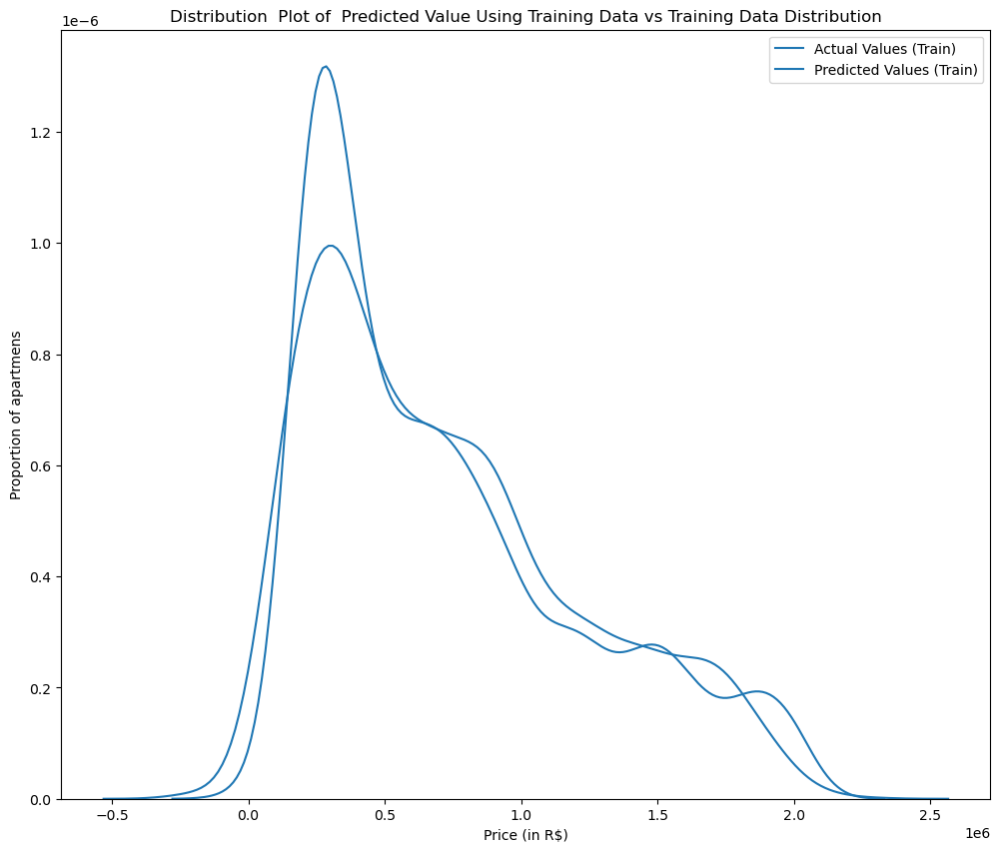

In [306]:
Title = 'Distribution  Plot of  Predicted Value Using Training Data vs Training Data Distribution'
DistributionPlot(y_train, yhat_train, "Actual Values (Train)", "Predicted Values (Train)", Title)

In [256]:

from sklearn.model_selection import ShuffleSplit
from sklearn.model_selection import cross_val_score
cv = ShuffleSplit(n_splits=5, test_size=0.2, random_state=0)

Rcross = cross_val_score(LinearRegression(),X,y,cv = cv)

In [257]:
print("The mean of the folds are", Rcross.mean(), "and the standard deviation is" , Rcross.std())

The mean of the folds are 0.95442240936832 and the standard deviation is 0.003594033420261167


In [258]:
-1 * cross_val_score(lr,X, y,cv=4,scoring='neg_mean_squared_error')

array([1.40680718e+10, 1.37714461e+10, 1.17167396e+10, 1.38085685e+30])

In [259]:
yhat_train = lr.predict(X_train)
yhat_train[0:5]

array([[1386453.66539131],
       [ 668294.74227733],
       [ 321126.62884444],
       [ 832445.02374357],
       [1659169.04138785]])

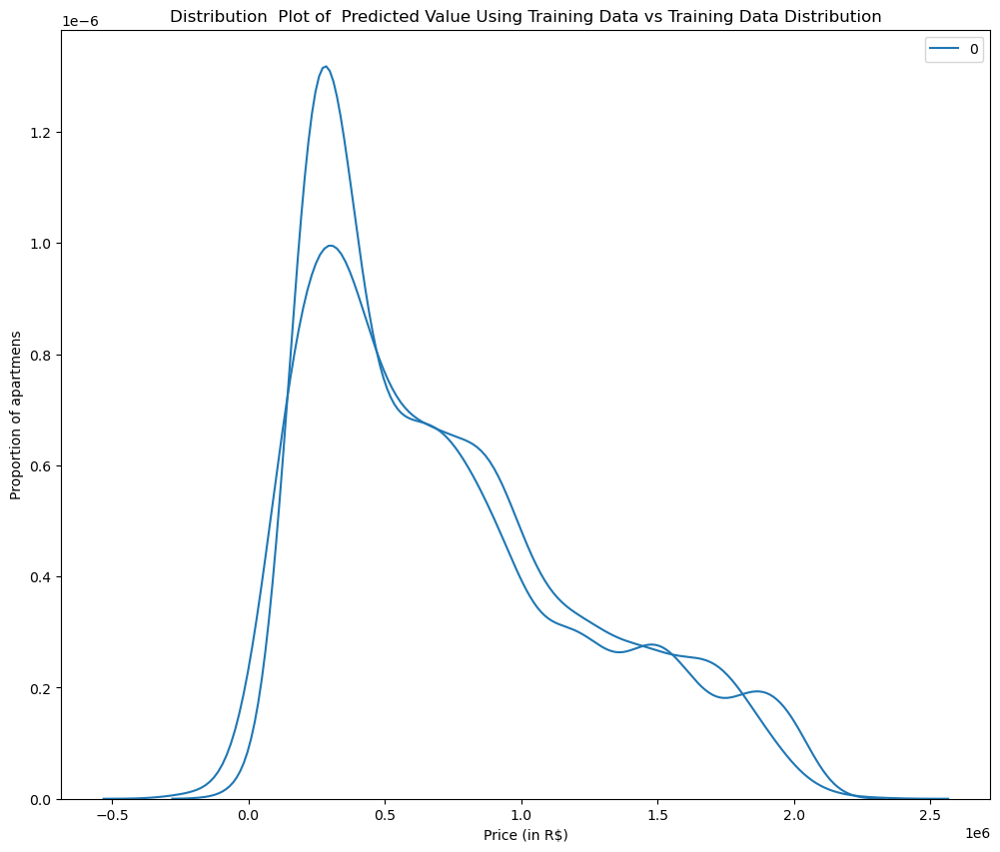

In [260]:
Title = 'Distribution  Plot of  Predicted Value Using Training Data vs Training Data Distribution'
DistributionPlot(y_train, yhat_train, "Actual Values (Train)", "Predicted Values (Train)", Title)

In [261]:
from sklearn.preprocessing import PolynomialFeatures
pr = PolynomialFeatures(degree=2)
x_train_pr = pr.fit_transform(X_train)
x_test_pr = pr.fit_transform(X_test)


In [262]:
from sklearn.linear_model import Ridge
RigeModel = Ridge(alpha=10) 
RigeModel.fit(x_train_pr, y_train)
RigeModel.score(x_test_pr, y_test)

0.9991868415833792

In [263]:
from sklearn.model_selection import GridSearchCV
parameters1= [{'alpha': [0.001,0.1,1, 10, 100, 1000, 10000, 100000, 100000]}]
RR=Ridge()
Grid1 = GridSearchCV(RR, parameters1,cv=4, scoring='r2')

In [264]:
Grid1.fit(X, y)
BestRR=Grid1.best_estimator_
BestRR

Ridge(alpha=100)

In [265]:
BestRR.score(X_test, y_test)

0.958350534432834

In [266]:

yhat_train_2 = Grid1.predict(X_train)
yhat_train_2[0:5]



array([[1381099.55982106],
       [ 661840.53650891],
       [ 325204.98716572],
       [ 827414.9065238 ],
       [1642710.335254  ]])

In [267]:
yhat_test_2 = Grid1.predict(X_test)
yhat_test_2[0:5]

array([[ 354006.44856902],
       [ 988381.38176043],
       [ 428867.39371788],
       [ 436158.66475416],
       [1154753.51398862]])

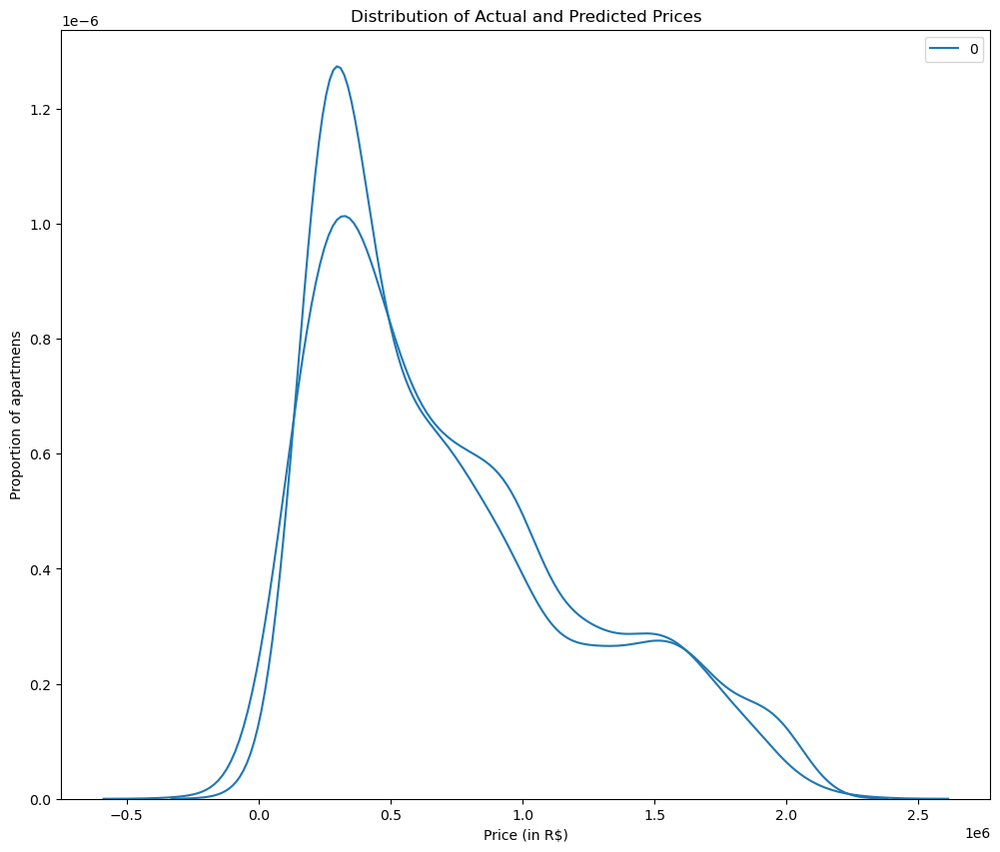

In [268]:
DistributionPlot(y_test, yhat_test_2, 'Actual', 'Predicted', 'Distribution of Actual and Predicted Prices')

In [269]:
BestRR=Grid1.best_estimator_
BestRR

Ridge(alpha=100)

In [270]:
BestRR.score(X_test, y_test)

0.958350534432834

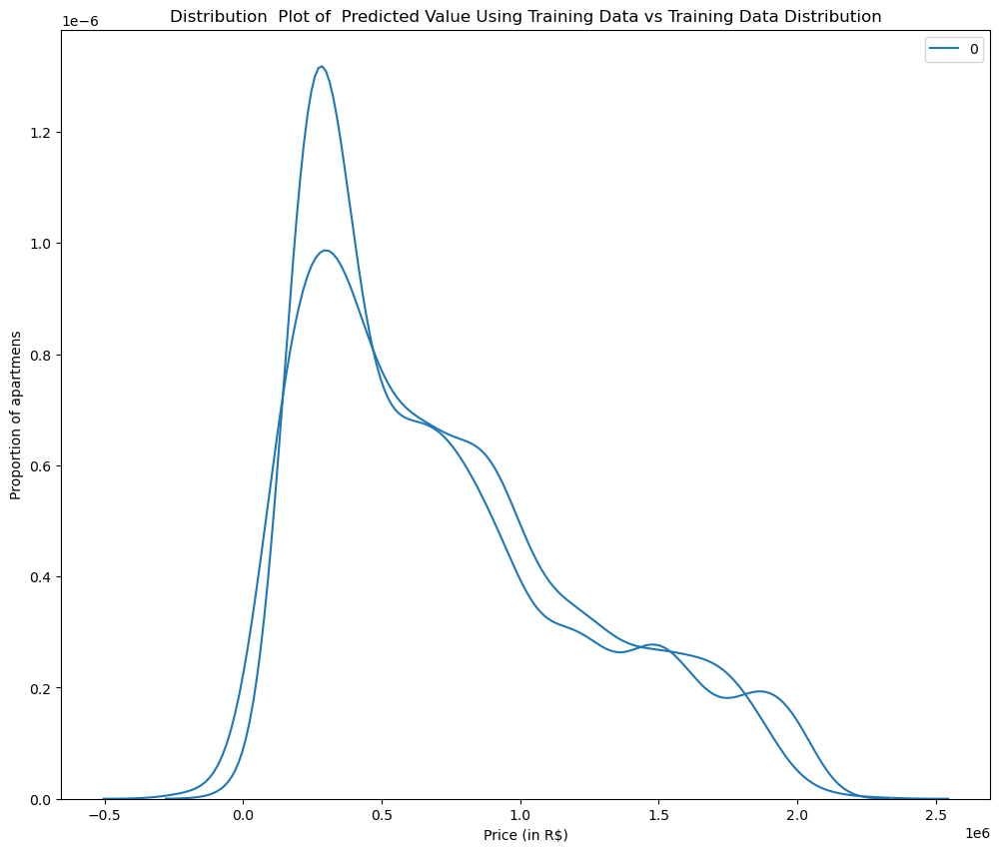

In [271]:
Title = 'Distribution  Plot of  Predicted Value Using Training Data vs Training Data Distribution'
DistributionPlot(y_train, yhat_train_2, "Actual Values (Train)", "Predicted Values (Train)", Title)

In [248]:
from sklearn.pipeline import Pipeline

from feature_engine.selection import DropCorrelatedFeatures, SmartCorrelatedSelection # Attribute Selection

from sklearn.ensemble import RandomForestClassifier # Classificator
from sklearn.tree import DecisionTreeClassifier # Classificator
from sklearn.neighbors import KNeighborsClassifier #Classificator


from sklearn.feature_selection import mutual_info_classif
from sklearn.feature_selection import SelectKBest, f_classif
from sklearn.feature_selection import SequentialFeatureSelector as SFS
from sklearn.feature_selection import RFE

from sklearn.model_selection import StratifiedKFold
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import RandomizedSearchCV

from imblearn.pipeline import Pipeline as ImbPipeline # ImbPipeline possibilita lidar com transformadores de amostragem como SMOTE

from sklearn.model_selection import train_test_split # Split arrays or matrices into random train and test subsets.
#Feature selector
smartC = SmartCorrelatedSelection(
    threshold=0.8,
    method='pearson')


# Classifificadores testados
# Tested Classifiers

# Random Forest (rf)
randomforest = RandomForestClassifier(
    n_estimators=100,
    random_state=10
)

#DecisionTreeClassifier (dt)
decisiontree = DecisionTreeClassifier()

#KNeighborsClassifier(KNN)
knn = KNeighborsClassifier(metric= 'euclidean')

In [138]:
selector = {
    'threshold':[0.7,0.75, 0.8, 0.85],
    'method':['pearson','kendall','spearman','callable'],
    'scoring':['model_performance']
}

kf = StratifiedKFold(n_splits = 10)
param_grid_dt = {'model__criterion': ['gini','entropy','log_loss'],
              'model__splitter' : ['best','random'],
              'model__max_features':['sqrt','log2']
            #    'SmartCorrelatedSelection__threshold': [0.7, 0.75, 0.8, 0.85],
    # 'SmartCorrelatedSelection__method': ['pearson', 'kendall', 'spearman', 'callable'],
              }

# Hiperparâmetros Random Forest
param_grid_rf = {
    'model__n_estimators': [100, 200, 500],  # Número de árvores na floresta
    'model__max_depth': [10, 20, 30, None],  # Profundidade máxima da árvore
    'model__min_samples_split': [2, 5, 10],  # Número mínimo de amostras requeridas para dividir um nó interno
    'model__min_samples_leaf': [1, 2, 4],  # Número mínimo de amostras requeridas para ser um nó folha
    'model__bootstrap': [True, False]  # Método de seleção de amostras para treinar cada árvore
}

# Hiperparâmetros KNeighborsClassifier (Knn)
param_grid_knn = {
    'model__n_neighbors': [3, 5, 7, 9],  # Número de vizinhos a serem usados
    'model__weights': ['uniform', 'distance'],  # Peso das amostras
    'model__metric': ['euclidean', 'manhattan']  # Métrica usada para o cálculo da distância
}

In [139]:
skf = StratifiedKFold(n_splits = 10)

# Smart Correlation
pipeline_smarc_dt = ImbPipeline(steps=[
    ('feature selection', smartC ),
    ('model', decisiontree)
])

# hyperparameter
random_search_dt = RandomizedSearchCV(estimator=pipeline_smarc_dt,
                           param_distributions=param_grid_dt,
                           cv=skf,
                           return_train_score=True,
                           refit=True)

# Fit the GridSearchCV to your data
random_search_dt.fit(X_train, y_train)

# Make predictions with the optimized pipeline
pipeline_smarc_dt_hype_pred = random_search_dt.predict(X_test)



c:\Users\Renan\.conda\envs\real_state_prediction\Lib\site-packages\sklearn\model_selection\_split.py:737: UserWarning:

The least populated class in y has only 1 members, which is less than n_splits=10.

